In [5]:
import matplotlib.pyplot as plt
import numpy as np, pandas as pd, scipy as sp

## Define variables

In [9]:
%%time
h = 2256e3      #J/kg
c_l = 4187      #J/K/kg liquid water 
c_v = 1996      #J/K/kg water vapour
T_0 = 283       #K
A = 4.5e-9      #m^2 
Gamma = 0.6712
R = 461.67
rho = 997       #kg/m^3
l = 0.30        #m
d = 1.57e-3     #m

p_0 = np.array([1.0, 1.4, 1.8, 2.2])*1e5 #Pa

V_tube = (l*np.pi*d**2)/4

V_0 = 0.1*V_tube #m^3 
delt = 0.1
t = np.arange(0,2500,delt)
p_vap0 = 1e5
T_vap0 = 373
h_vap = 40e3
R_vap = 8.341
T_c0 = h_vap*T_vap0/(T_vap0*R_vap*np.log(p_vap0/p_0)+h_vap)
m_0 = p_0*A*Gamma/(np.sqrt(R*T_c0))
m = np.zeros((len(p_0), len(t)))
p = np.zeros((len(p_0), len(t)))

T_c = np.zeros((len(p_0), len(t)))
temp = np.zeros((len(p_0), len(t)))
m[: ,0] = m_0
p[: ,0] = p_0
T_c = 600
temp[:,0] = 0
for jj in range(0,len(p_0)):
    for ii in range(1,len(t)):
        p[jj,ii] =V_0*p_0[jj]/(V_0+temp[jj,ii-1])
        m[jj,ii] = p[jj,ii-1]*A*Gamma/(np.sqrt(R*T_c))
        temp[jj,ii] = temp[jj,ii-1]+m[jj,ii]*delt/rho

T_vap = h_vap*T_vap0/(T_vap0*R_vap*np.log(p_vap0/p)+h_vap)

CPU times: user 524 ms, sys: 5.14 ms, total: 529 ms
Wall time: 530 ms


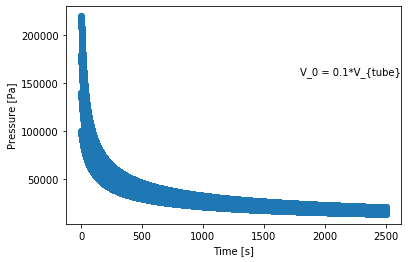

In [43]:
'''
figure (1)
plot(t ,p)
xlabel( ’Time␣[s] ’)
ylabel( ’Pressure␣[Pa] ’)
legend( ’p_0␣=␣1.0␣bar ’ , ’p_0␣=␣1.4␣bar ’ , 
'''

fig, ax = plt.subplots(1,1)

ax.text(1800, 1.6e5, 'V_0 = 0.1*V_{tube}')
ax.scatter(np.tile(t, (np.size(p,0), 1)), p)
ax.set_xlabel('Time [s]')
ax.set_ylabel('Pressure [Pa]')
fig.grid = True

In [42]:
p

array([[100000.        , 100000.        ,  99900.98814573, ...,
         14064.58674202,  14064.31100293,  14064.03528006],
       [140000.        , 140000.        , 139806.01359344, ...,
         16688.58897936,  16688.25993971,  16687.93091952],
       [180000.        , 180000.        , 179679.4554938 , ...,
         18952.95898821,  18952.58412228,  18952.20927859],
       [220000.        , 220000.        , 219521.35132803, ...,
         20974.37325019,  20973.95756773,  20973.54190997]])